In [40]:
import albumentations as A
import numpy as np
import pandas as pd
import torch
from PIL import Image
from matplotlib import pyplot as plt
from IPython.display import display
from torchvision.utils import make_grid
from albumentations.pytorch.transforms import ToTensorV2

from src.constants import DATA_PATH
from src.utils import read_image, load_all_categories

In [41]:
images_path = DATA_PATH / "Images" / "image"
pairs_data = pd.read_csv(DATA_PATH / "popularity_pairs.csv")

In [42]:
pairs_data

,image_filename_high,shortcode_high,category,image_filename_low,shortcode_low
0,100pintas-1894332843247332559.jpg,BpKBa8wHOzP,family,100pintas-1896392533234058899.jpg,BpRVvYiHoaT
1,100pintas-1827854534519422570.jpg,Bld2APHHf5q,family,100pintas-1824164029369428893.jpg,BlQu4UWnCud
2,100pintas-1945798895692877668.jpg,BsA3clOHw9k,family,100pintas-1946655746072473629.jpg,BsD6RZUn3Ad
3,100pintas-1915975581223084448.jpg,BqW6aPNH-Gg,family,100pintas-1921747231113647131.jpg,BqrauzCnpQb
4,100pintas-1839178883629163745.jpg,BmGE3NFHaTh,family,100pintas-1845227882517677668.jpg,BmbkPuTHMZk
...,...,...,...,...,...
506443,zoenewlove-1721818578396822573.jpg,BflIN_dArwt,travel,zoenewlove-1723333002118937145.jpg,BfqgjwdAbo5
506444,zoenewlove-1769109724223114201.jpg,BiNI-vJAgvZ,travel,zoenewlove-1768751360649502442.jpg,BiL3f3DgJ7q
506445,zoenewlove-1688648675657744417.jpg,BdvSQYPA4Ah,travel,zoenewlove-1682030521418484139.jpg,BdXxdjyg4mr
506446,zoenewlove-1794196440479152467.jpg,BjmRCgUB7lT,travel,zoenewlove-1794124517057269996.jpg,BjmAr4aBJDs


In [53]:
def plot_image_pairs(pairs: pd.DataFrame):
    transform = A.Compose(
        [
            A.Resize(512, 512),
            ToTensorV2(),
        ]
    )

    image_pairs = []
    category = None
    for row in pairs.itertuples():
        if category is None:
            category = row.category

        high_image = read_image(images_path / row.image_filename_high)
        low_image = read_image(images_path / row.image_filename_low)

        high_image = transform(image=high_image)["image"]
        low_image = transform(image=low_image)["image"]

        paired_image = torch.cat((high_image, low_image), axis=2)
        image_pairs.append(paired_image)

    grid = make_grid(image_pairs, nrow=4, padding=15, pad_value=0)
    grid = grid.permute(1, 2, 0)

    plt.figure(figsize=(18, 10))
    plt.imshow(grid)
    plt.axis("off")
    plt.tight_layout()
    plt.title(f"Category: {category.upper()} (left image is more popular)")
    plt.show()

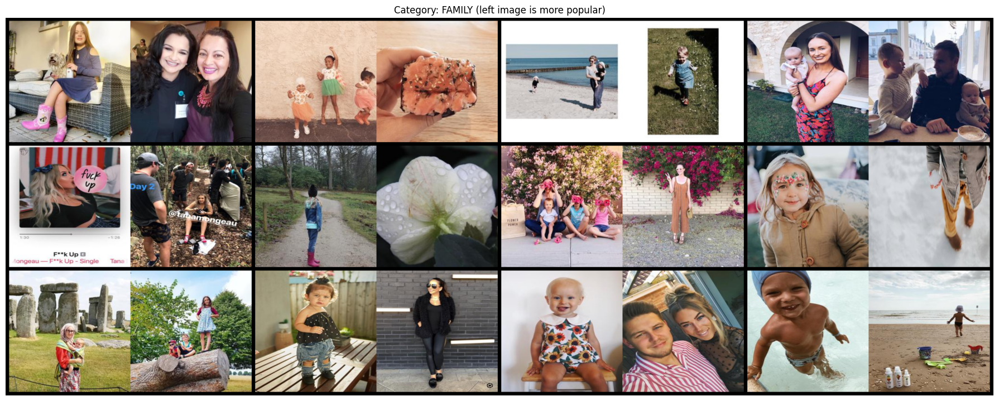

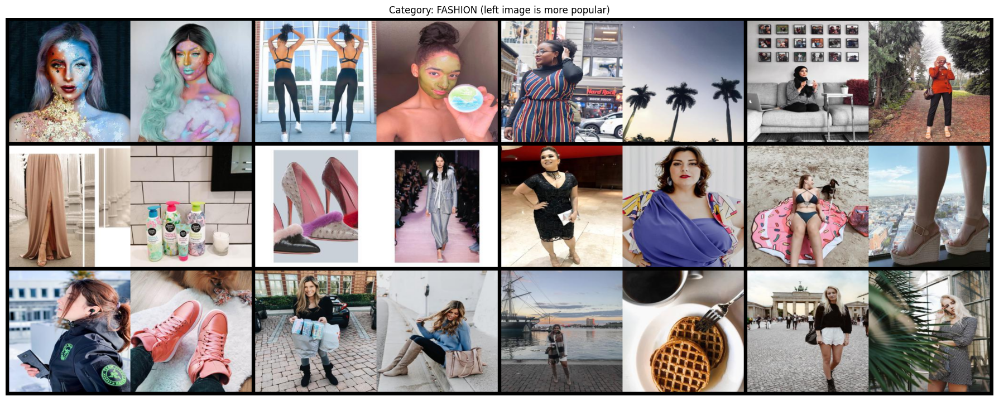

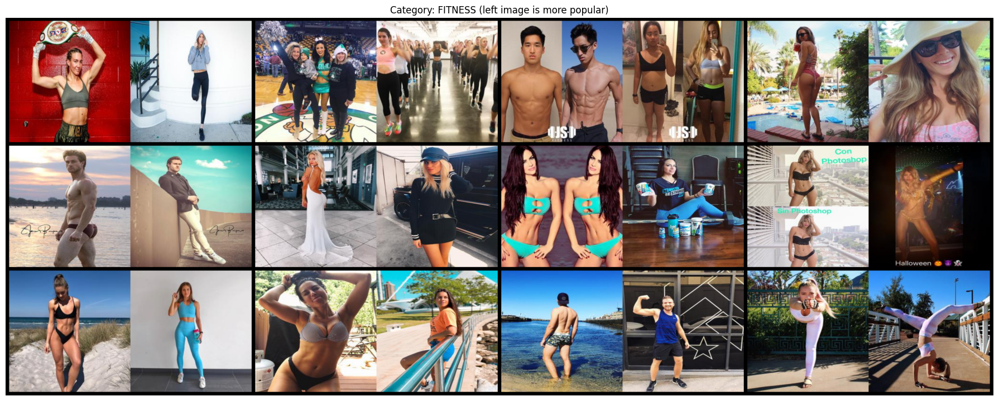

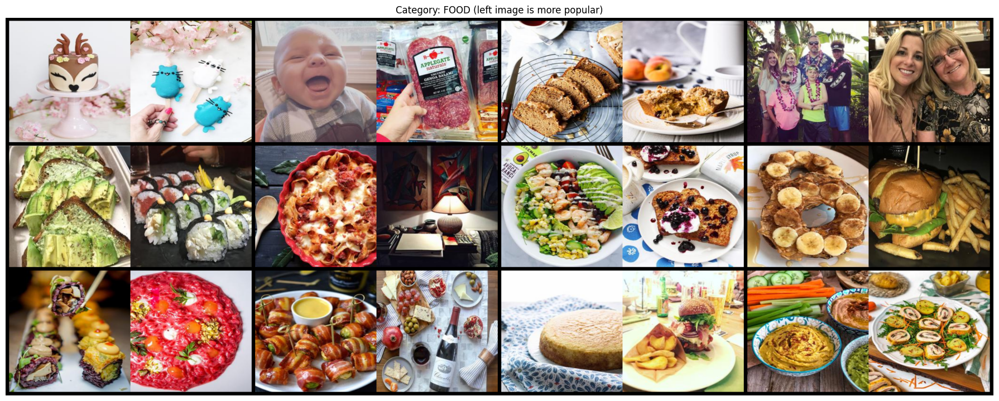

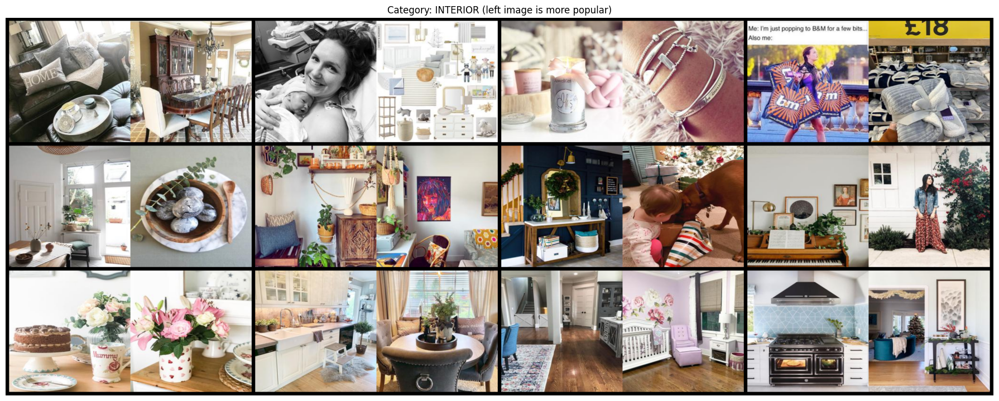

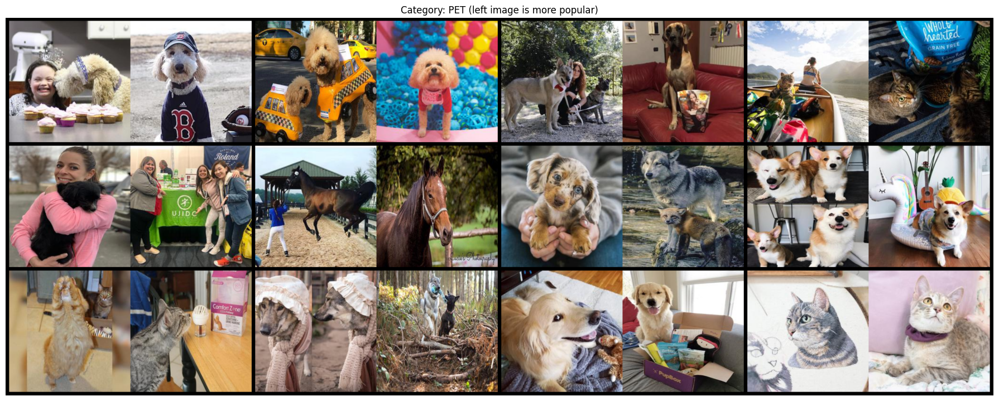

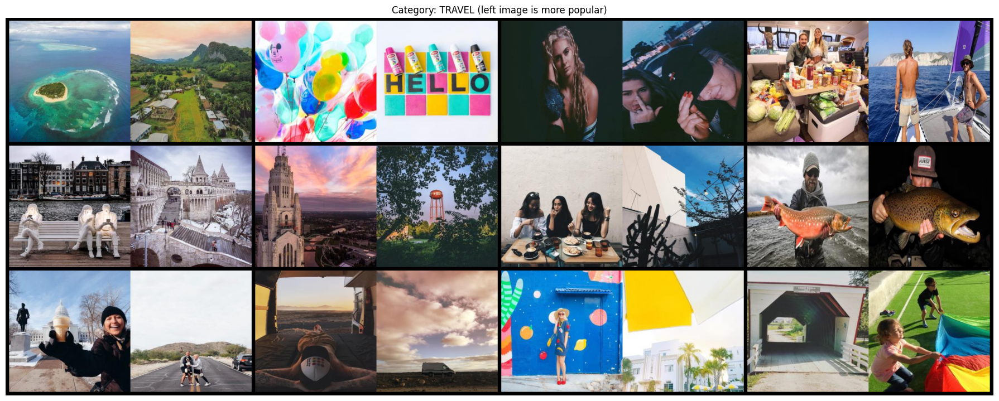

In [55]:
for category, category_pairs in pairs_data.groupby("category"):
    plot_image_pairs(category_pairs.sample(12))